This ipynb is created for primarily exploratory data analysis. Containing plots of relationship between different sets of variables by years.

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from auxiliary import *

sns.set_theme(style="ticks")



In [3]:
df = pd.read_csv('data/gps_demo_donate_gdp.csv', index_col= 0)
# pd.options.display.max_columns = None
df.head()


,country,isocode,patience,risktaking,posrecip,negrecip,altruism,trust,demo2019,demo2018,...,funding2010_gdp,funding2011_gdp,funding2012_gdp,funding2013_gdp,funding2014_gdp,funding2015_gdp,funding2016_gdp,funding2017_gdp,funding2018_gdp,funding2019_gdp
0,Afghanistan,AFG,-0.201360,0.120764,0.289641,0.254712,0.166455,0.315964,2.85,2.97,...,0.015009,0.000019,0.000015,0.000010,NaN,0.000005,NaN,NaN,0.019865,0.004728
1,Algeria,DZA,0.059815,0.391530,-0.598255,0.254901,-0.009968,-0.177371,4.01,3.50,...,0.006272,0.008004,NaN,0.000953,0.000005,0.000000,0.000412,0.000006,0.000006,NaN
2,Argentina,ARG,-0.229308,0.041503,0.159679,-0.140457,0.027347,-0.206733,7.02,7.02,...,0.000012,0.000020,0.000024,0.000030,0.000044,NaN,0.000032,0.000209,0.000051,0.000034
3,Australia,AUS,0.657004,0.137137,0.069660,0.022190,0.155331,0.298973,9.09,9.09,...,0.025639,0.022390,0.017528,0.016698,0.018348,0.012298,0.016976,0.018337,0.017304,0.022305
4,Austria,AUT,0.608285,-0.061829,0.161047,-0.055415,-0.035363,0.154628,8.29,8.29,...,0.006628,0.004192,0.003989,0.004116,0.004186,0.004920,0.009023,0.011740,0.005729,0.007277


# 1. Altruism to humanitarian donation per GDP
# 2003 ~ 2019


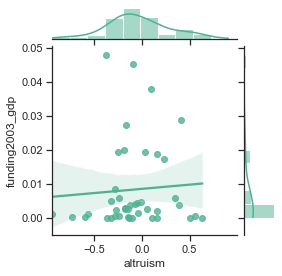

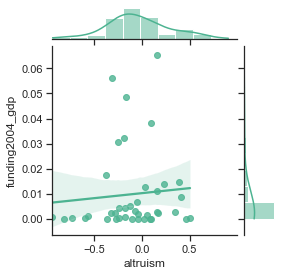

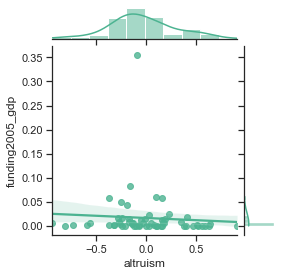

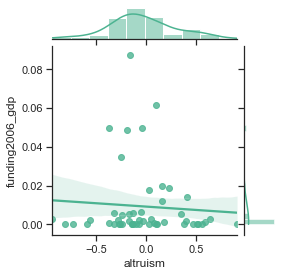

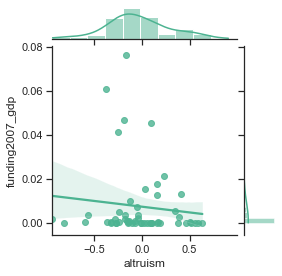

...

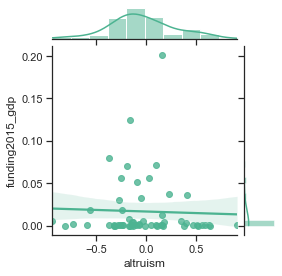

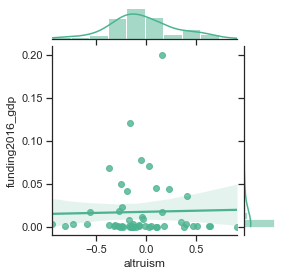

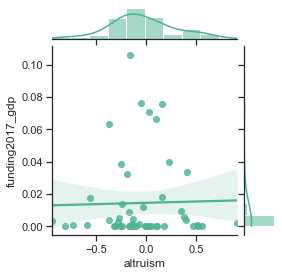

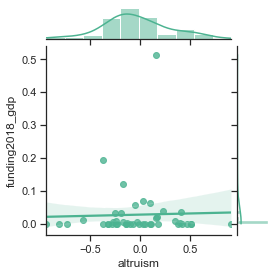

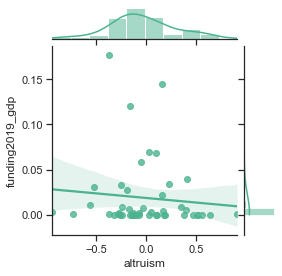

In [5]:
for i in range(17):
    y = add_prefix(i + 3, prefix='funding') + '_gdp'
    regplot('altruism', y,  df)


# 2. Altruism to democratic index 
# 2006 ~ 2019
# summary: stable negative correlation 

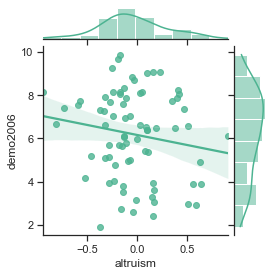

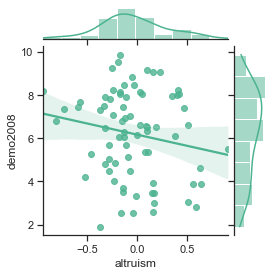

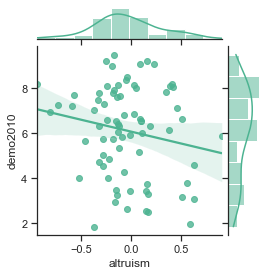

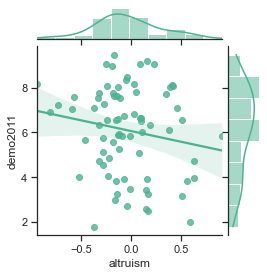

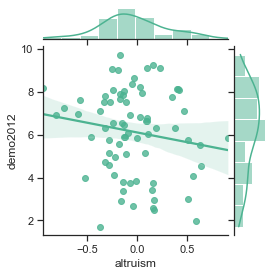

...

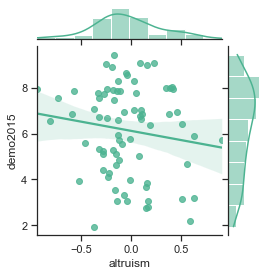

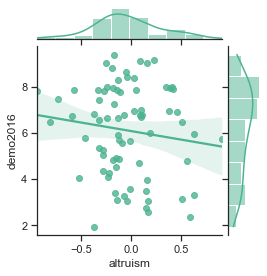

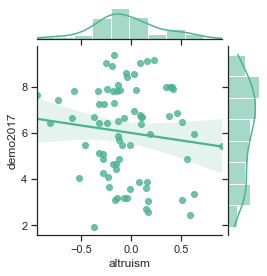

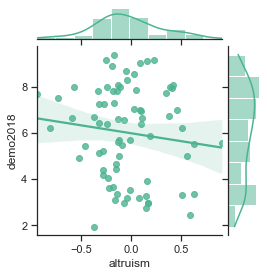

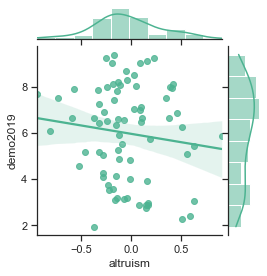

In [6]:
demo_year = sorted([2019, 2018, 2017, 2016, 2015, 2014, 2013, 2012, 2011, 2010,  2008, 2006])
for i in range(len(demo_year)):
    y = 'demo' + str(demo_year[i])
    regplot('altruism', y,  df)


# 3. democratic index to humanitarian donation per GDP
# 2006 ~ 2019

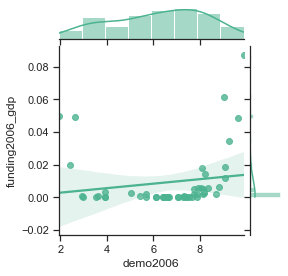

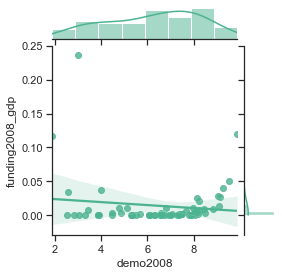

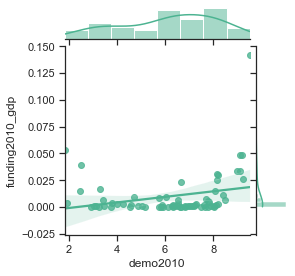

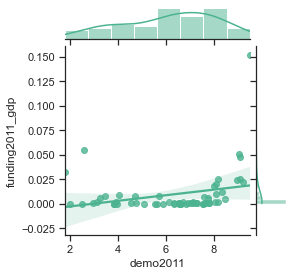

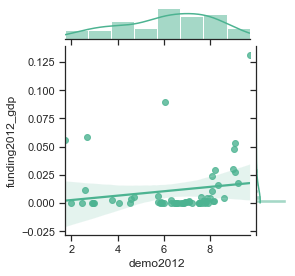

...

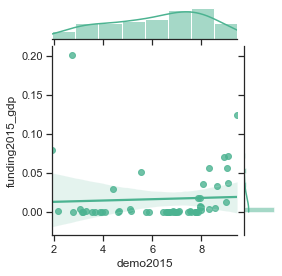

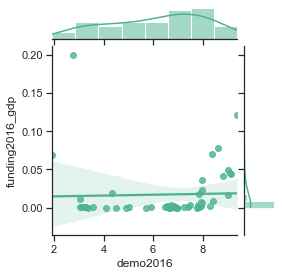

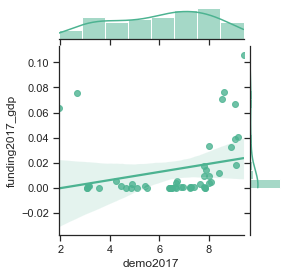

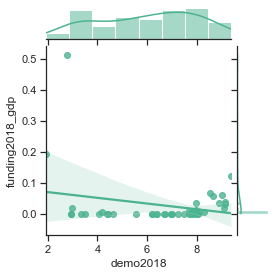

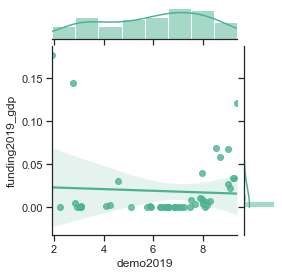

In [7]:
for i in range(len(demo_year)):
    x = 'demo' + str(demo_year[i])
    y = f'funding{demo_year[i]}_gdp'
    regplot(x, y, df)

# 4. altruism to humanitarian donation per GDP shading by democratic index
# 2006 ~ 2019


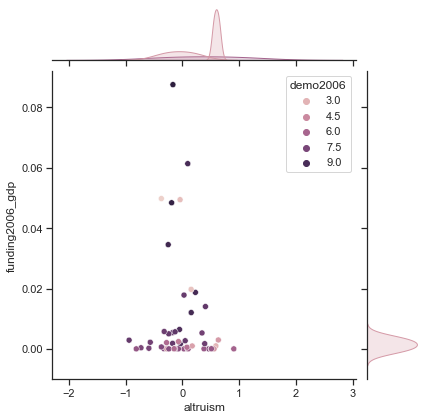

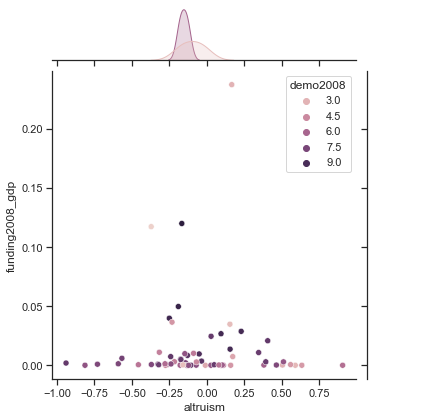

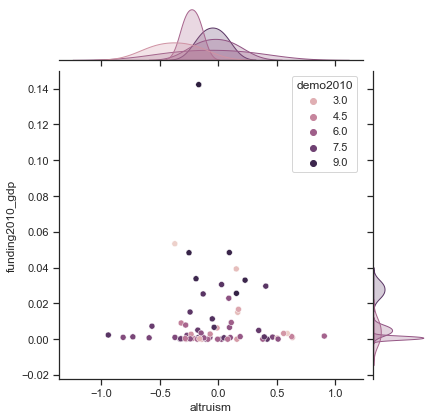

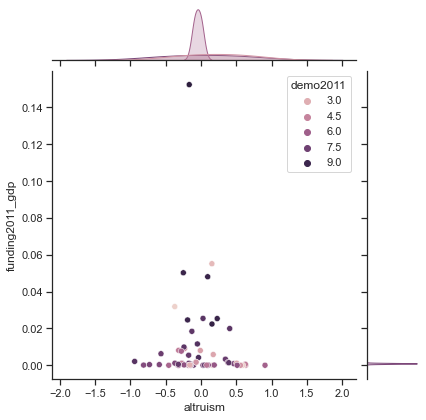

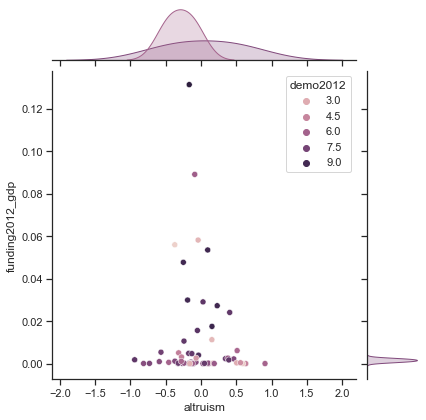

...

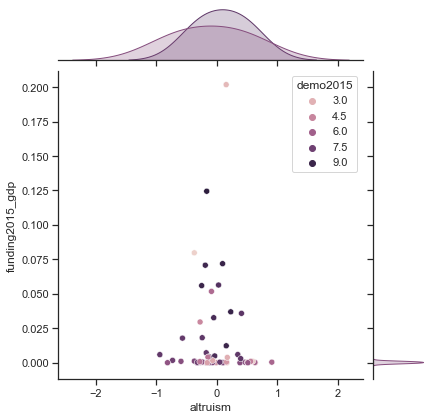

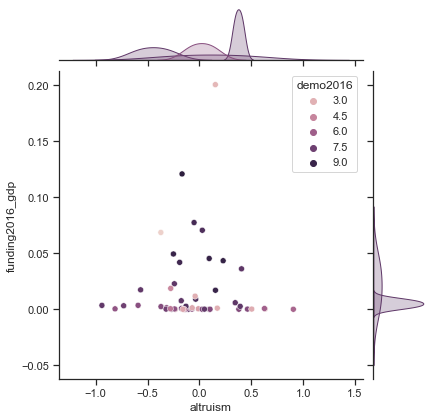

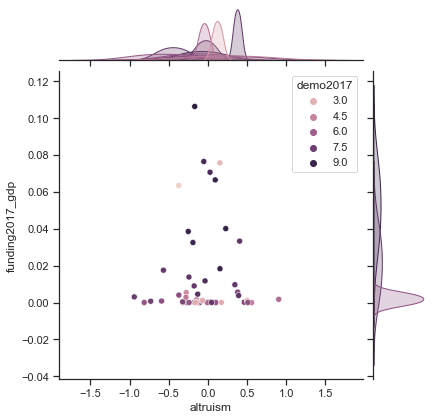

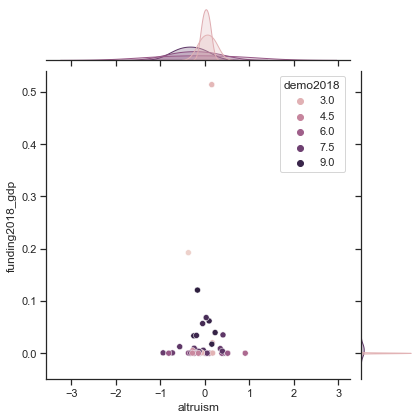

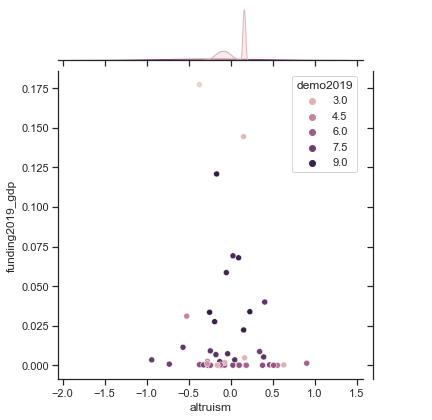

In [8]:
for i in range(len(demo_year)):
    z = 'demo' + str(demo_year[i])
    y = f'funding{demo_year[i]}_gdp'
    scatterplot('altruism', y, z, df)

# 5. listing country has maximum humanitarian donation per GDP by year
# 2003 ~ 2019
# summary: mixing of some most and least democratic countries

In [9]:
df_index = df.set_index('country')
df_filter = df_index.filter(regex='funding.*_gdp')
df_filter.idxmax()

funding2003_gdp            Saudi Arabia
funding2004_gdp    United Arab Emirates
funding2005_gdp                  Malawi
funding2006_gdp                  Sweden
funding2007_gdp                  Sweden
funding2008_gdp             Afghanistan
funding2009_gdp                  Sweden
funding2010_gdp                  Sweden
funding2011_gdp                  Sweden
funding2012_gdp                  Sweden
funding2013_gdp                  Sweden
funding2014_gdp                  Sweden
funding2015_gdp    United Arab Emirates
funding2016_gdp    United Arab Emirates
funding2017_gdp                  Sweden
funding2018_gdp    United Arab Emirates
funding2019_gdp            Saudi Arabia
dtype: object

# 6. Altruism to  humanitarian donation shading by democratic index
# 2006 ~ 2019
# to see whether without dviding by GDP gives a different result

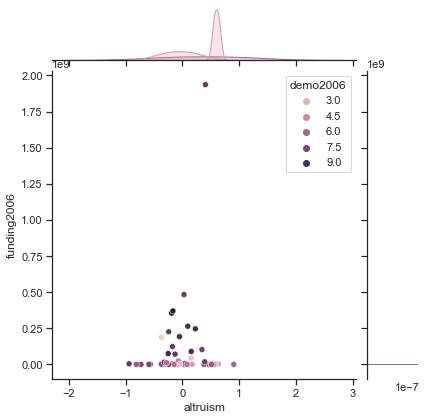

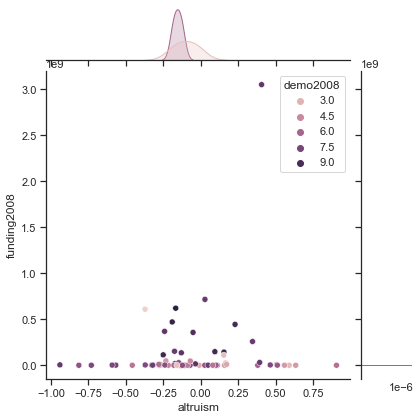

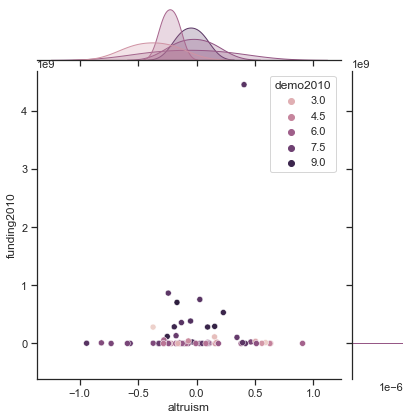

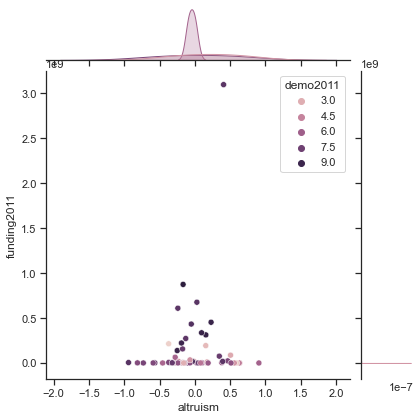

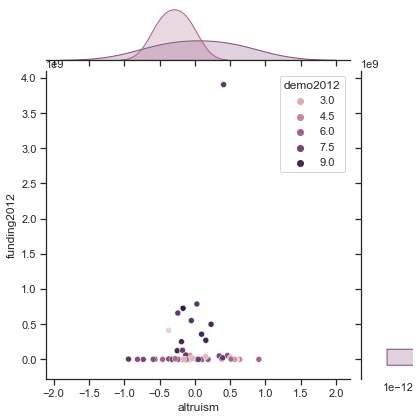

...

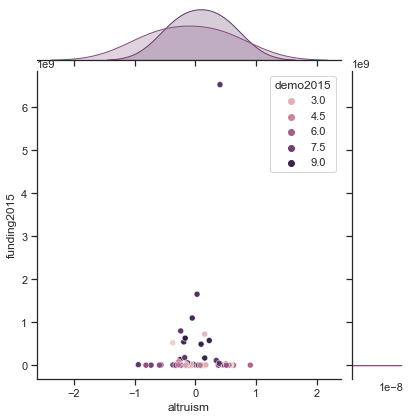

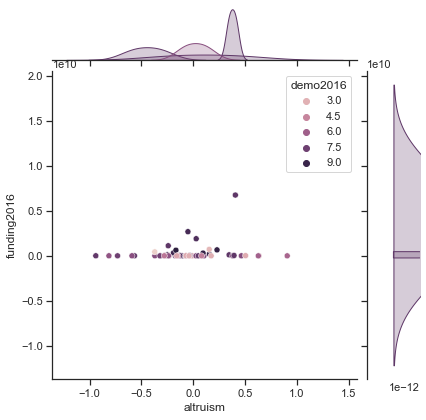

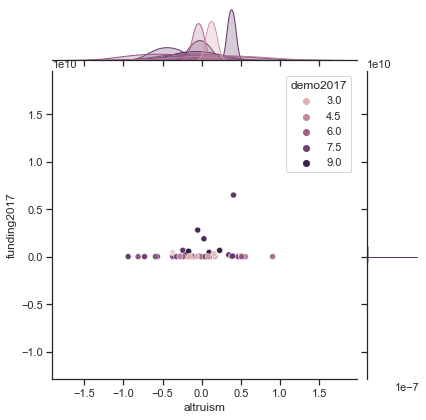

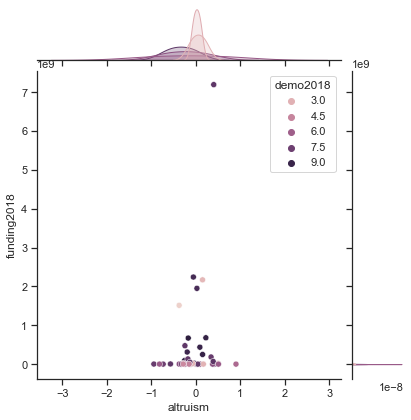

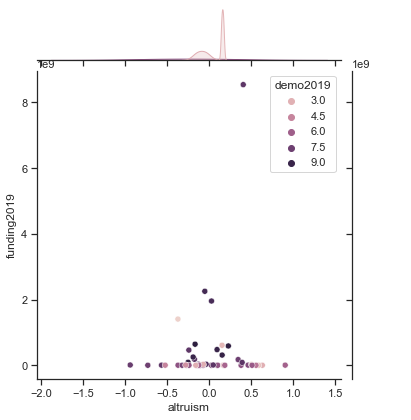

In [10]:
for i in range(len(demo_year)):
    z = 'demo' + str(demo_year[i])
    y = f'funding{demo_year[i]}'
    scatterplot('altruism', y, z, df)


# 7. listing country has maximum humanitarian donation by year
# 2003 ~ 2019
# comment: United State always donate the most 

In [23]:
df_index = df.set_index('country')
df_filter = df_index.filter(regex='funding_[0-9]+$')
df_filter.idxmax()

funding_3     United States
funding_4     United States
funding_5     United States
funding_6     United States
funding_7     United States
funding_8     United States
funding_9     United States
funding_10    United States
funding_11    United States
funding_12    United States
funding_13    United States
funding_14    United States
funding_15    United States
funding_16    United States
funding_17    United States
funding_18    United States
funding_19    United States
funding_20    United States
dtype: object

# 8. GDP last year to funding
# 2004 ~ 2019
# comment: positive correlation, but most likely results from superficial reason

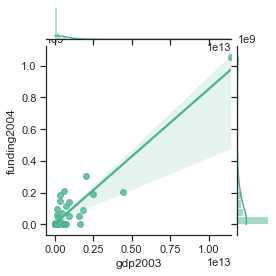

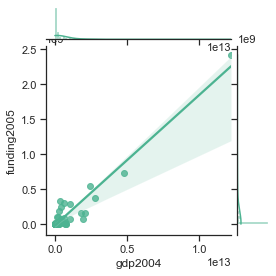

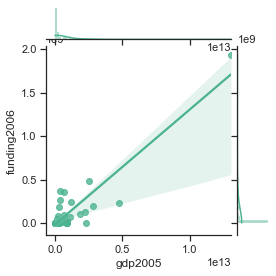

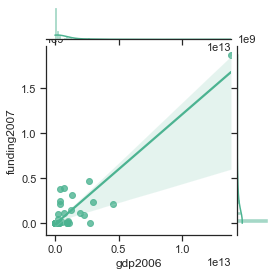

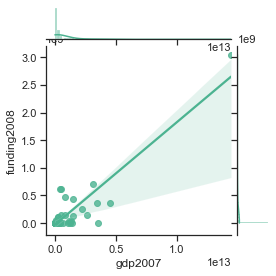

...

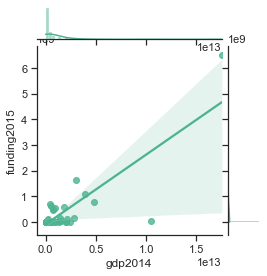

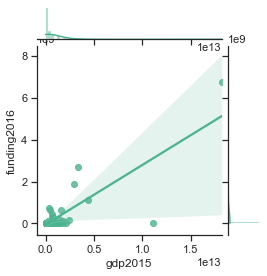

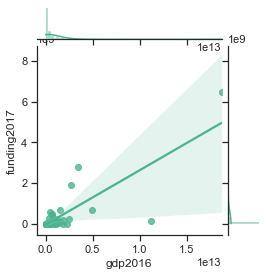

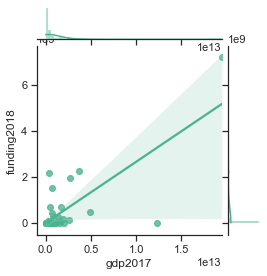

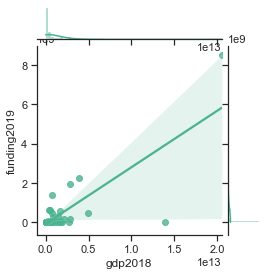

In [12]:
for i in range(16):
    x = add_prefix(i + 3, prefix='gdp')
    y = add_prefix(i + 4, prefix='funding')
    regplot(x, y, df)

# 9. GDP last year to funding per GDP
# 2004 ~ 2019
# summary: after adjust funding to percent of GDP the effect is barely noticible

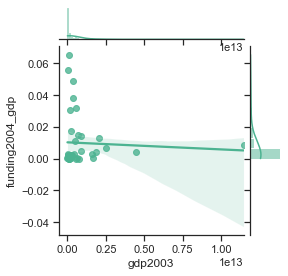

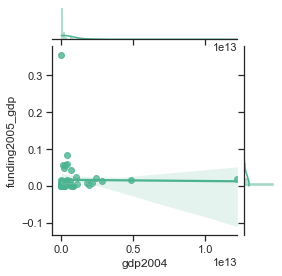

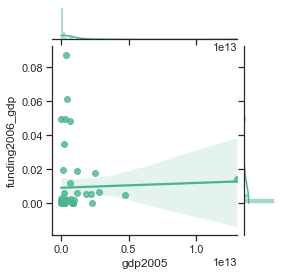

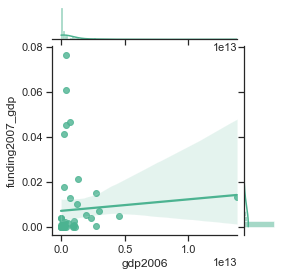

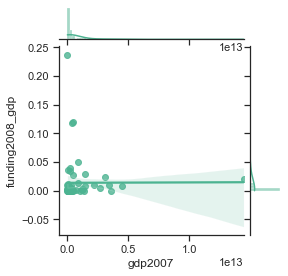

...

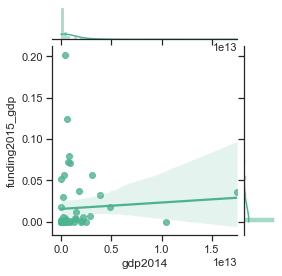

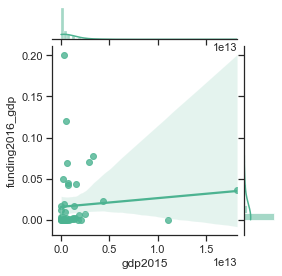

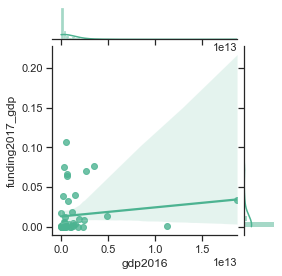

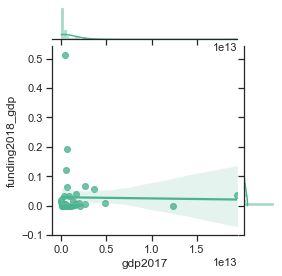

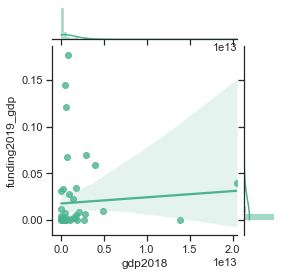

In [13]:
for i in range(16):
    x = add_prefix(i + 3, prefix='gdp')
    y = add_prefix(i + 4, prefix='funding') + '_gdp'
    regplot(x, y, df)

# 10. democratic to gdp
# 2006 ~ 2019
# summary: mild but clear positive correlation

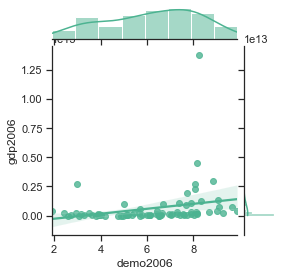

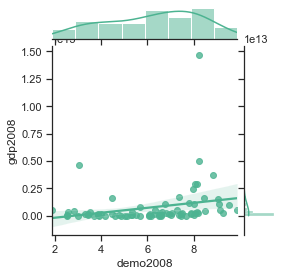

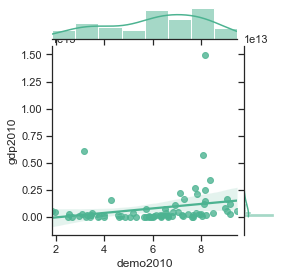

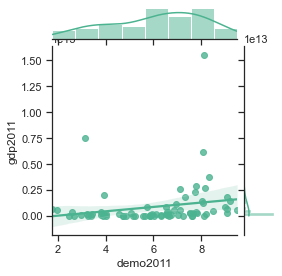

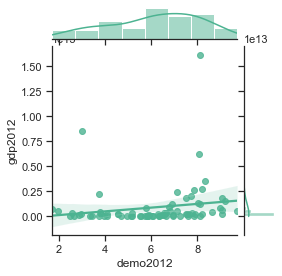

...

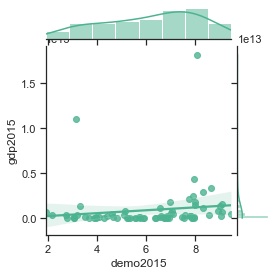

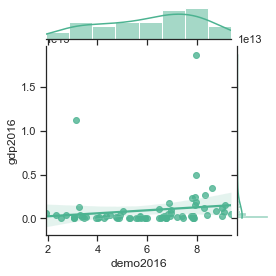

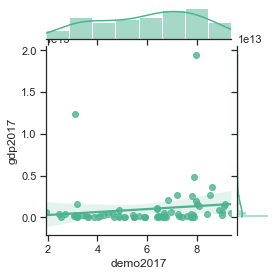

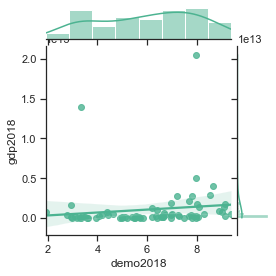

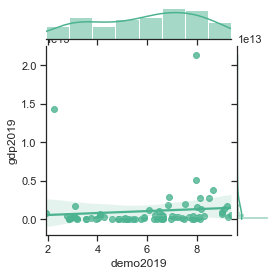

In [14]:
for i in range(len(demo_year)):
    x = 'demo' + str(demo_year[i])
    y = f'gdp{demo_year[i]}'
    regplot(x, y, df)